<a href="https://colab.research.google.com/github/MayurPatil2711/ES-335/blob/main/Assignment4Q1_Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# References:

https://machinelearningmastery.com/how-to-develop-a-convolutional-neural-network-to-classify-photos-of-dogs-and-cats/

In [ ]:
# load dogs vs cats dataset, reshape and save to a new file
from os import listdir
from numpy import asarray
from numpy import save
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Loading Training Images (Mountain)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# define location of dataset
folder = '/content/drive/MyDrive/Assignment4/train/mountain/'
photos, labels = list(), list()
# enumerate files in the directory
for file in listdir(folder):
	# determine class
	output = 0
	if file.startswith('Mountain'):
		output = 0
	# load image
	photo = load_img(folder + file, target_size=(224, 224))
	# convert to numpy array
	photo = img_to_array(photo)
	# store
	photos.append(photo)
	labels.append(output)
# convert to a numpy arrays
train_mountain_images = asarray(photos)
train_mountain_labels = asarray(labels)

In [ ]:
train_mountain_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
train_mountain_images.shape

(80, 224, 224, 3)

In [ ]:
np.unique(train_mountain_images)

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

# Loading Training Images (Peacock)

In [ ]:
# define location of dataset
folder = '/content/drive/MyDrive/Assignment4/train/peacock/'
photos, labels = list(), list()
# enumerate files in the directory
for file in listdir(folder):
	# determine class
	output = 0
	if file.startswith('Peacock'):
		output = 1
	# load image
	photo = load_img(folder + file, target_size=(224, 224))
	# convert to numpy array
	photo = img_to_array(photo)
	# store
	photos.append(photo)
	labels.append(output)
# convert to a numpy arrays
train_peacock_images = asarray(photos)
train_peacock_labels = asarray(labels)

In [ ]:
train_peacock_images.shape

(80, 224, 224, 3)

In [ ]:
train_peacock_labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
type(train_peacock_images)

numpy.ndarray

# Combining Training Data

In [ ]:
train_images = np.concatenate((train_peacock_images/225, train_mountain_images/225), axis = 0)
train_images.shape

(160, 224, 224, 3)

In [ ]:
train_labels = np.concatenate((train_peacock_labels, train_mountain_labels), axis = 0)
train_labels.shape

(160,)

In [ ]:
train_images[0]

array([[[0.75555557, 0.6       , 0.4311111 ],
        [0.74666667, 0.6       , 0.40888888],
        [0.47111112, 0.3511111 , 0.15111111],
        ...,
        [0.24444444, 0.18222222, 0.01777778],
        [0.50666666, 0.40444446, 0.33333334],
        [0.63555557, 0.51555556, 0.4311111 ]],

       [[0.7511111 , 0.5822222 , 0.40888888],
        [0.6666667 , 0.52      , 0.3288889 ],
        [0.40444446, 0.28444445, 0.07555556],
        ...,
        [0.46222222, 0.38222224, 0.16      ],
        [0.60888886, 0.50222224, 0.37777779],
        [0.60444444, 0.50222224, 0.3511111 ]],

       [[0.6577778 , 0.50222224, 0.31555554],
        [0.5644444 , 0.42222223, 0.21333334],
        [0.33333334, 0.21777777, 0.        ],
        ...,
        [0.56      , 0.4488889 , 0.2711111 ],
        [0.44      , 0.32444444, 0.22222222],
        [0.33777776, 0.2488889 , 0.10222222]],

       ...,

       [[0.18222222, 0.16444445, 0.03555556],
        [0.25777778, 0.23111111, 0.07111111],
        [0.32444444, 0

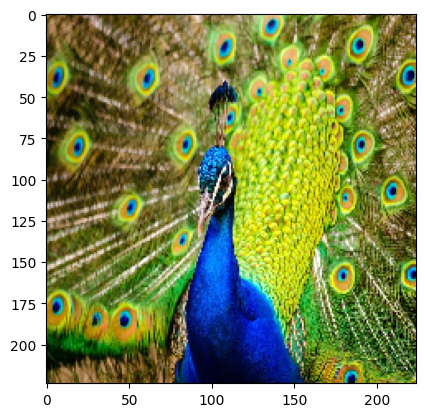

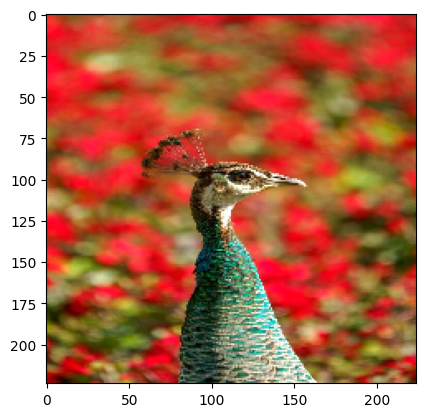

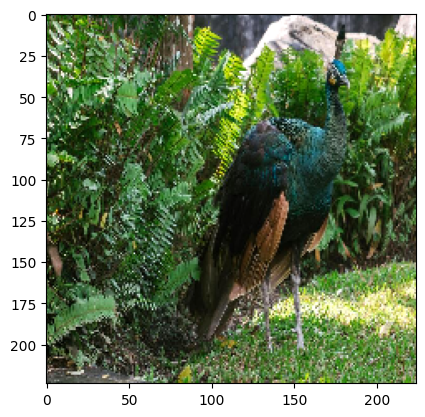

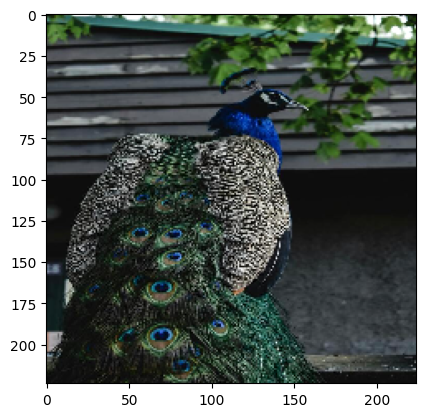

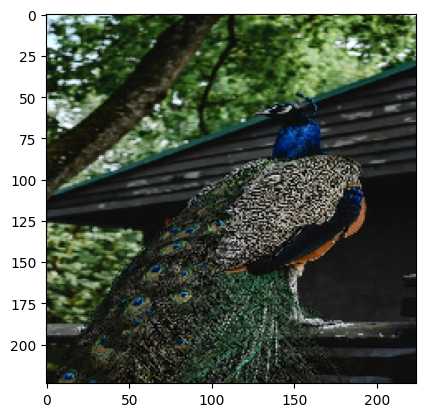

...

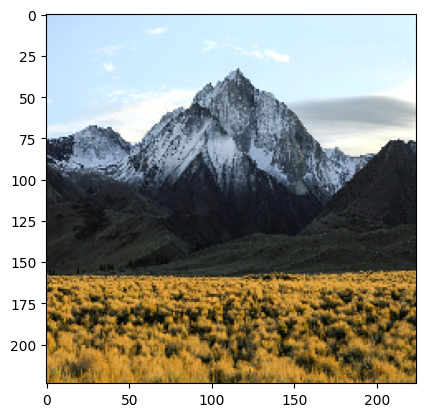

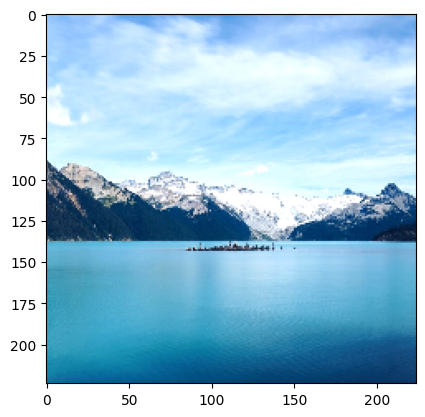

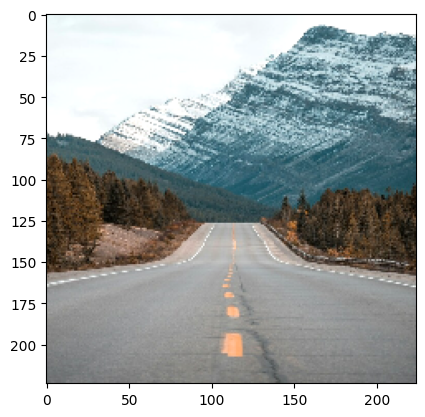

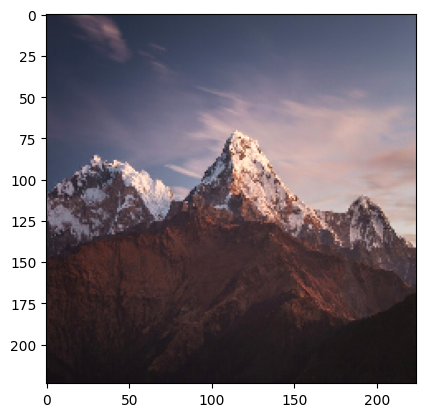

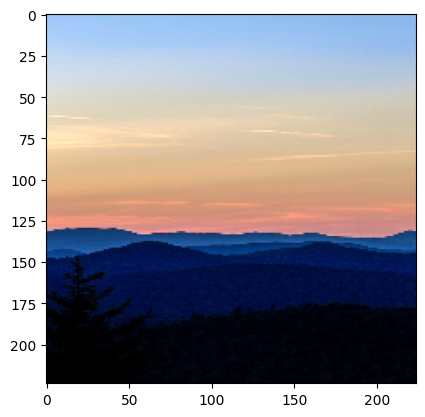

In [ ]:
for i in range(160):
  if i % 10 == 0:
    plt.imshow(train_images[i])
    plt.show()

In [ ]:
train_labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0])

In [ ]:
import sys
from matplotlib import pyplot
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from keras.optimizers import SGD
from keras.preprocessing.image import ImageDataGenerator
import pickle

# Loading Test Dataset

In [ ]:
# define location of dataset
folder = '/content/drive/MyDrive/Assignment4/test/peacock/'
photos, labels = list(), list()
# enumerate files in the directory
for file in listdir(folder):
	# determine class
	output = 0
	if file.startswith('Peacock'):
		output = 1
	# load image
	photo = load_img(folder + file, target_size=(224, 224))
	# convert to numpy array
	photo = img_to_array(photo)
	# store
	photos.append(photo)
	labels.append(output)
# convert to a numpy arrays
test_peacock_images = asarray(photos)
test_peacock_labels = asarray(labels)

In [ ]:
# define location of dataset
folder = '/content/drive/MyDrive/Assignment4/test/mountain/'
photos, labels = list(), list()
# enumerate files in the directory
for file in listdir(folder):
	# determine class
	output = 0
	if file.startswith('Mountain'):
		output = 0
	# load image
	photo = load_img(folder + file, target_size=(224, 224))
	# convert to numpy array
	photo = img_to_array(photo)
	# store
	photos.append(photo)
	labels.append(output)
# convert to a numpy arrays
test_mountain_images = asarray(photos)
test_mountain_labels = asarray(labels)

In [ ]:
test_images = np.concatenate((test_peacock_images/225, test_mountain_images/225), axis = 0)
test_images.shape

(40, 224, 224, 3)

In [ ]:
test_labels = np.concatenate((test_peacock_labels, test_mountain_labels), axis = 0)
test_labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

# VGG 1-Block

In [ ]:
def OneBlock():
 model = Sequential()
 model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(224, 224, 3)))
 model.add(MaxPooling2D((2, 2)))
 model.add(Flatten())
 model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
 model.add(Dense(1, activation='sigmoid'))
 # compile model
 opt = SGD(learning_rate=0.001, momentum=0.8)
 model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
 return model

In [ ]:
VGG1_model = OneBlock()
history_VGG1 = VGG1_model.fit(train_images, train_labels, batch_size = 32, epochs = 15)

Epoch 1/15
5/5 [==============================] - 4s 45ms/step - loss: 1.8788 - accuracy: 0.5375
Epoch 2/15
5/5 [==============================] - 0s 42ms/step - loss: 0.7820 - accuracy: 0.6750
Epoch 3/15
5/5 [==============================] - 0s 42ms/step - loss: 0.3671 - accuracy: 0.8313
Epoch 4/15
5/5 [==============================] - 0s 37ms/step - loss: 0.2423 - accuracy: 0.9000
Epoch 5/15
5/5 [==============================] - 0s 42ms/step - loss: 0.2250 - accuracy: 0.9125
Epoch 6/15
5/5 [==============================] - 0s 48ms/step - loss: 0.2074 - accuracy: 0.9187
Epoch 7/15
5/5 [==============================] - 0s 40ms/step - loss: 0.2180 - accuracy: 0.8938
Epoch 8/15
5/5 [==============================] - 0s 45ms/step - loss: 0.2033 - accuracy: 0.9125
Epoch 9/15
5/5 [==============================] - 0s 46ms/step - loss: 0.2156 - accuracy: 0.9187
Epoch 10/15
5/5 [==============================] - 0s 43ms/step - loss: 0.2625 - accuracy: 0.9187
Epoch 11/15
5/5 [============

In [ ]:
import pickle

file_path = '/content/drive/MyDrive/Assignment4/VGG1_model.pkl'

# Load the model
with open(file_path, 'wb') as f:
    pickle.dump(VGG1_model, f)

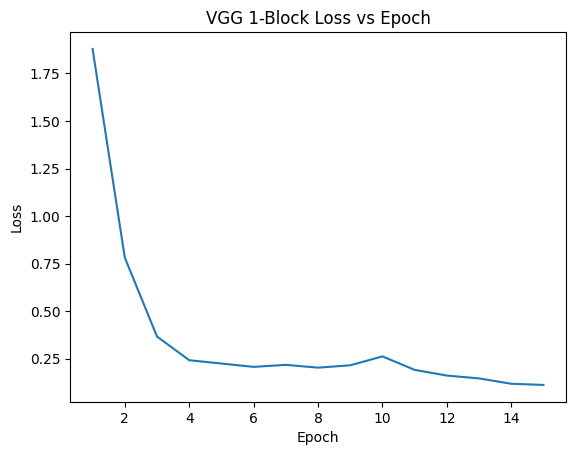

In [ ]:
VGG1_loss = history_VGG1.history['loss']
x1 = [i+1 for i in range(15)]

plt.plot(x1, VGG1_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VGG 1-Block Loss vs Epoch')
plt.show()

In [ ]:
import os
print(os.getcwd())

/content


In [ ]:
VGG1_model = pickle.load(open('/content/drive/MyDrive/Assignment4/VGG1_model.pkl', 'rb'))

In [ ]:
predicted_vgg1  = VGG1_model.predict(test_images).astype('int32').reshape(40,)
predicted_vgg1

2/2 [==============================] - 0s 10ms/step


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Mountain
False


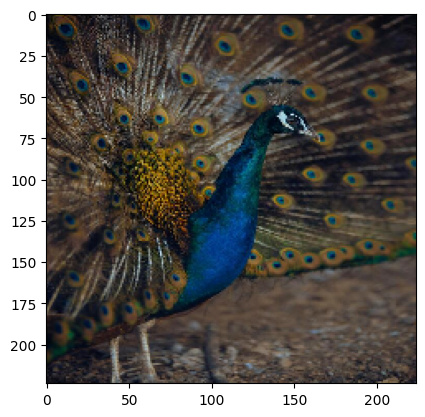

Mountain
False


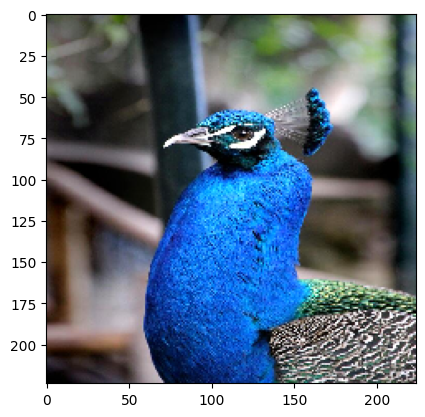

Mountain
False


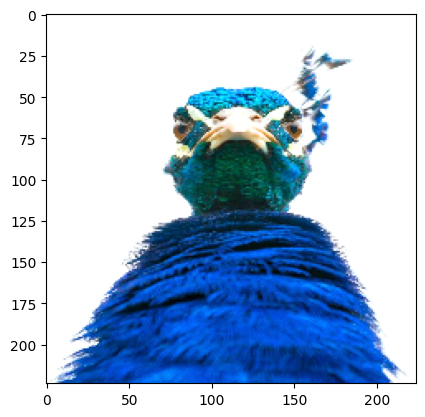

Mountain
False


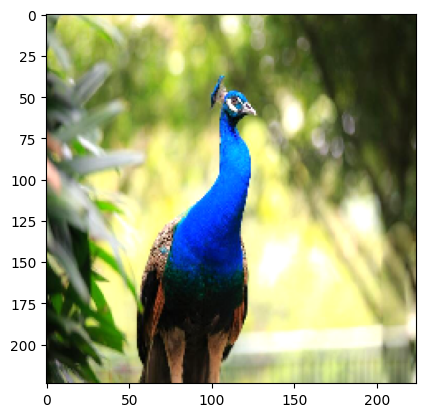

Mountain
False


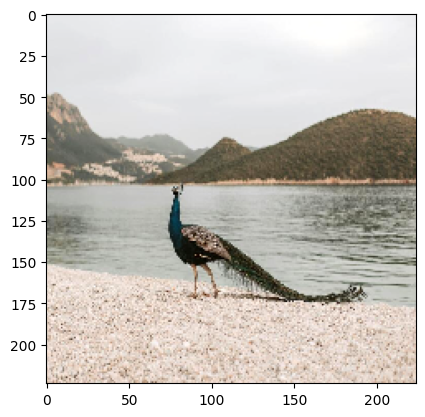

Mountain
True


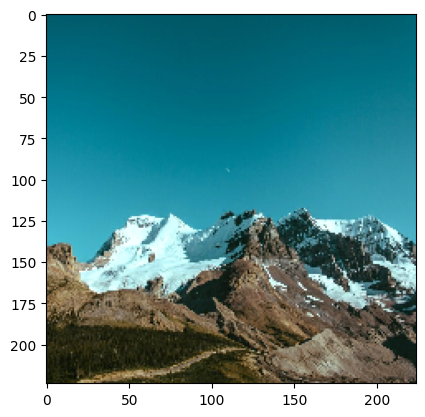

Mountain
True


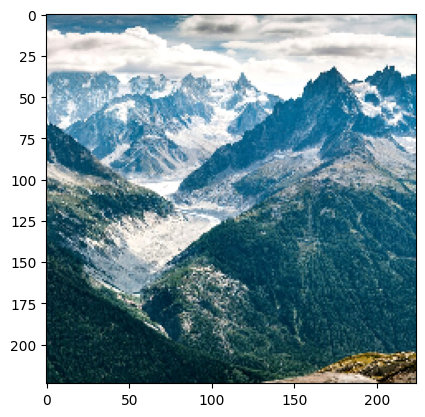

Mountain
True


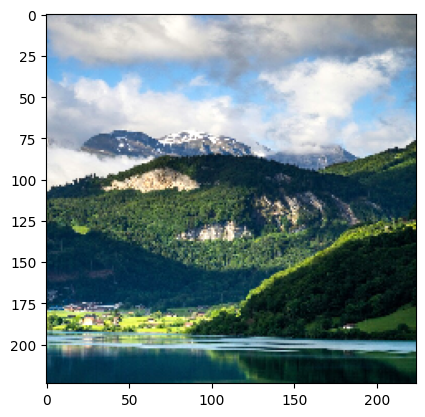

Mountain
True


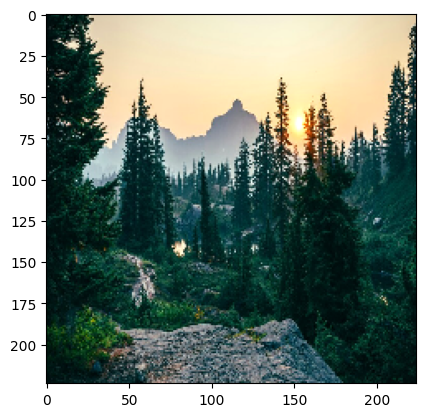

Mountain
True


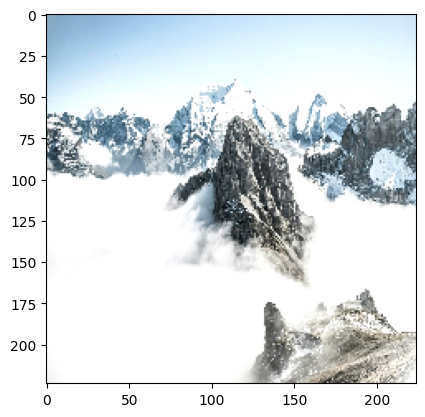

In [ ]:
for i in range(40):
  if i%4 == 0:
    answer = predicted_vgg1[i]
    actual_answer = test_labels[i]
    if answer == 1:
      print("Peacock")
    else:
      print("Mountain")
    print(answer == actual_answer)
    plt.imshow(test_images[i])
    plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(predicted_vgg1, test_labels)

0.5

# VGG 2-Block

In [ ]:
# define cnn model
def Two_Block():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(224, 224, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = SGD(learning_rate=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [ ]:
VGG2_model = Two_Block()
history_VGG2 = VGG2_model.fit(train_images, train_labels, batch_size = 32, epochs = 15)

Epoch 1/15
5/5 [==============================] - 3s 57ms/step - loss: 8.4215 - accuracy: 0.5000
Epoch 2/15
5/5 [==============================] - 0s 46ms/step - loss: 3.0785 - accuracy: 0.5437
Epoch 3/15
5/5 [==============================] - 0s 50ms/step - loss: 0.6794 - accuracy: 0.5000
Epoch 4/15
5/5 [==============================] - 0s 48ms/step - loss: 0.6295 - accuracy: 0.6938
Epoch 5/15
5/5 [==============================] - 0s 45ms/step - loss: 0.5539 - accuracy: 0.8500
Epoch 6/15
5/5 [==============================] - 0s 44ms/step - loss: 0.4512 - accuracy: 0.9187
Epoch 7/15
5/5 [==============================] - 0s 43ms/step - loss: 0.3355 - accuracy: 0.9187
Epoch 8/15
5/5 [==============================] - 0s 56ms/step - loss: 0.2504 - accuracy: 0.9187
Epoch 9/15
5/5 [==============================] - 0s 50ms/step - loss: 0.2009 - accuracy: 0.9312
Epoch 10/15
5/5 [==============================] - 0s 53ms/step - loss: 0.1808 - accuracy: 0.9250
Epoch 11/15
5/5 [============

In [ ]:
file_path = '/content/drive/MyDrive/Assignment4/VGG2_model.pkl'

# Load the model
with open(file_path, 'wb') as f:
    pickle.dump(VGG2_model, f)

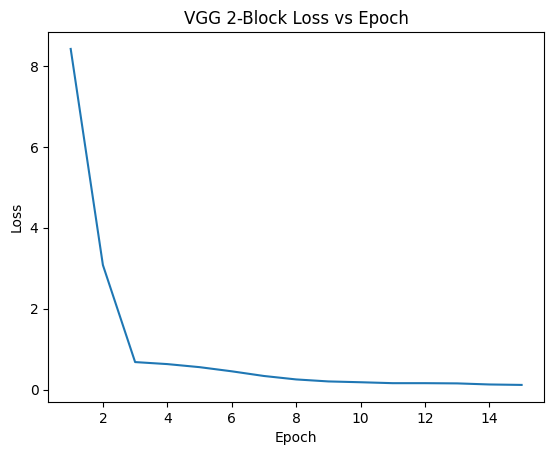

In [ ]:
loss_VGG2 = history_VGG2.history['loss']
x2 = [i+1 for i in range(15)]

plt.plot(x2, loss_VGG2)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VGG 2-Block Loss vs Epoch')
plt.show()

In [ ]:
VGG2_model = pickle.load(open('/content/drive/MyDrive/Assignment4/VGG2_model.pkl', 'rb'))

In [ ]:
predicted_vgg2  = VGG2_model.predict(test_images).astype('int32').reshape(40,)
predicted_vgg2

2/2 [==============================] - 0s 141ms/step


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Mountain
False


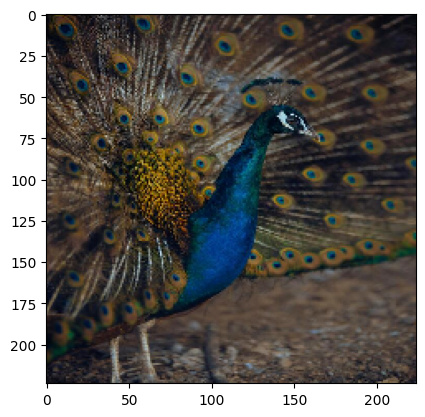

Mountain
False


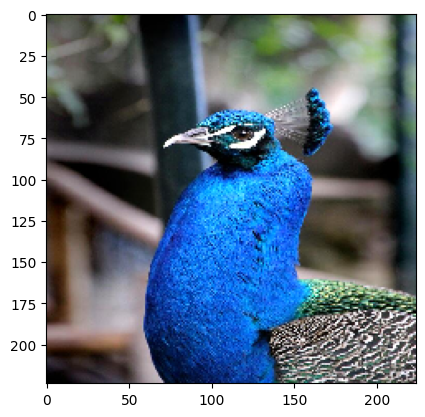

Mountain
False


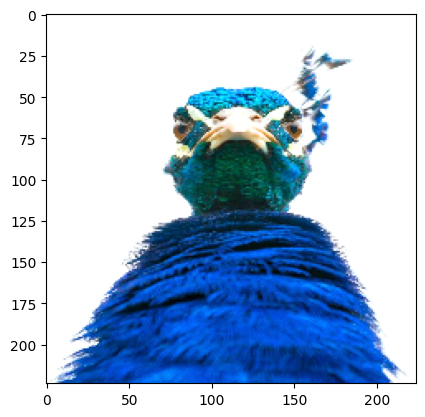

Mountain
False


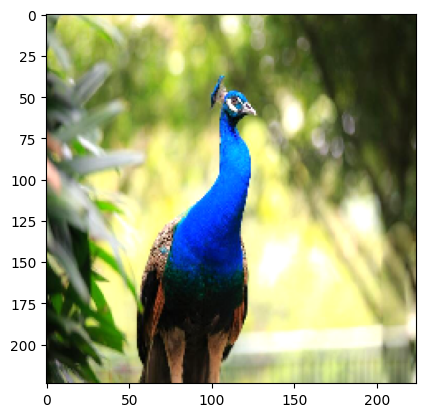

Mountain
False


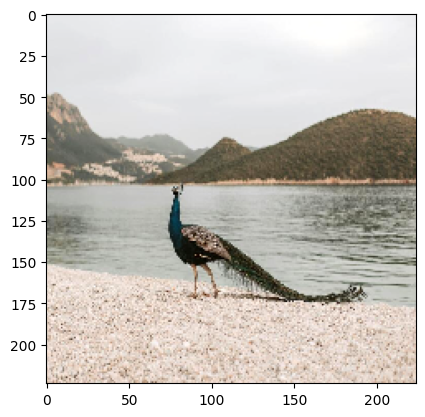

Mountain
True


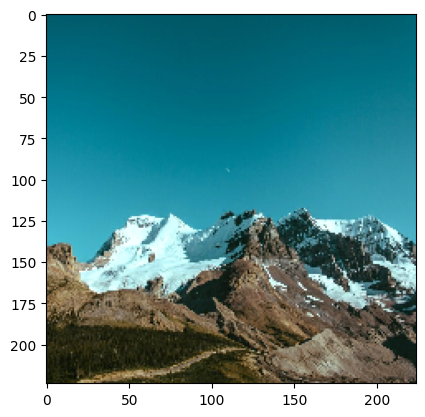

Mountain
True


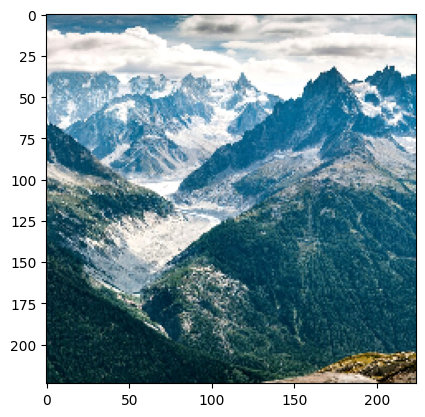

Mountain
True


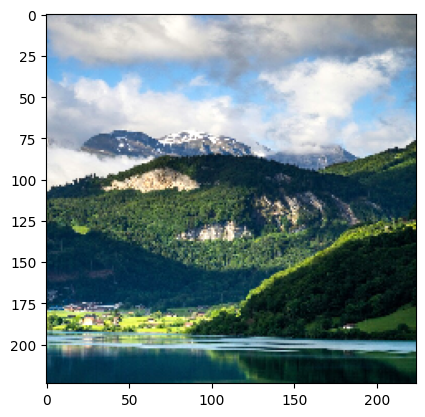

Mountain
True


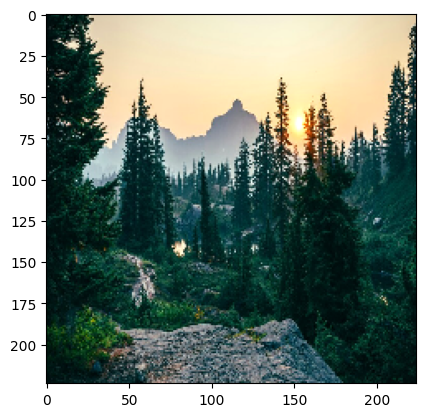

Mountain
True


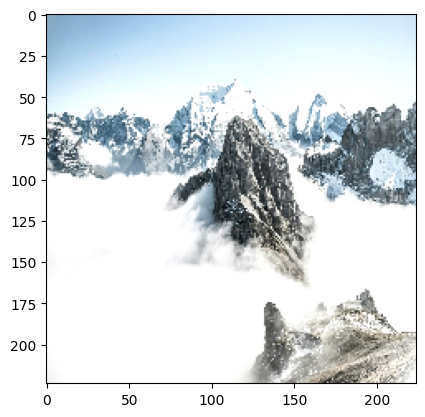

In [ ]:
for i in range(40):
  if i%4 == 0:
    answer = predicted_vgg2[i]
    actual_answer = test_labels[i]
    if answer == 1:
      print("Peacock")
    else:
      print("Mountain")
    print(answer == actual_answer)
    plt.imshow(test_images[i])
    plt.show()

In [ ]:
accuracy_score(predicted_vgg2, test_labels)

0.5

# VGG 3-Block

In [ ]:
# define cnn model
def Three_Block():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(224, 224, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = SGD(learning_rate=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [ ]:
VGG3_model = Three_Block()
history_VGG3 = VGG3_model.fit(train_images, train_labels, batch_size = 32, epochs = 15)

Epoch 1/15
5/5 [==============================] - 1s 66ms/step - loss: 2.0800 - accuracy: 0.4812
Epoch 2/15
5/5 [==============================] - 0s 51ms/step - loss: 0.8146 - accuracy: 0.5625
Epoch 3/15
5/5 [==============================] - 0s 49ms/step - loss: 0.6427 - accuracy: 0.7437
Epoch 4/15
5/5 [==============================] - 0s 49ms/step - loss: 0.6226 - accuracy: 0.7937
Epoch 5/15
5/5 [==============================] - 0s 49ms/step - loss: 0.5626 - accuracy: 0.7063
Epoch 6/15
5/5 [==============================] - 0s 49ms/step - loss: 0.4794 - accuracy: 0.8188
Epoch 7/15
5/5 [==============================] - 0s 49ms/step - loss: 0.4108 - accuracy: 0.8188
Epoch 8/15
5/5 [==============================] - 0s 48ms/step - loss: 0.3621 - accuracy: 0.8438
Epoch 9/15
5/5 [==============================] - 0s 49ms/step - loss: 0.3522 - accuracy: 0.8188
Epoch 10/15
5/5 [==============================] - 0s 50ms/step - loss: 0.3035 - accuracy: 0.8813
Epoch 11/15
5/5 [============

In [ ]:
file_path = '/content/drive/MyDrive/Assignment4/VGG3_model.pkl'

# Load the model
with open(file_path, 'wb') as f:
    pickle.dump(VGG3_model, f)

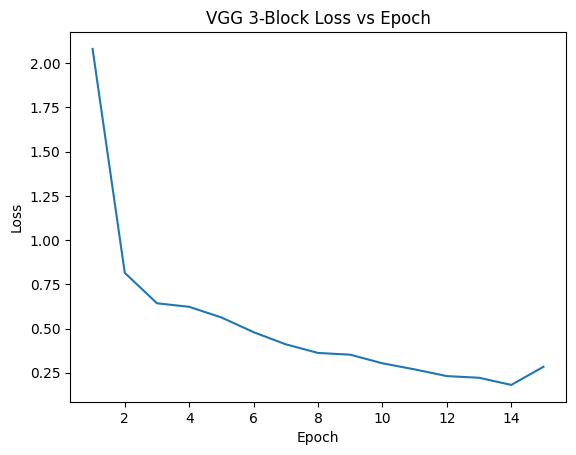

In [ ]:
VGG3_loss = history_VGG3.history['loss']
x3 = [i+1 for i in range(15)]

plt.plot(x3, VGG3_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VGG 3-Block Loss vs Epoch')
plt.show()

In [ ]:
VGG3_model = pickle.load(open('/content/drive/MyDrive/Assignment4/VGG3_model.pkl', 'rb'))

In [ ]:
predicted_vgg3  = VGG3_model.predict(test_images).astype('int32').reshape(40,)
predicted_vgg3

2/2 [==============================] - 0s 13ms/step


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Mountain
False


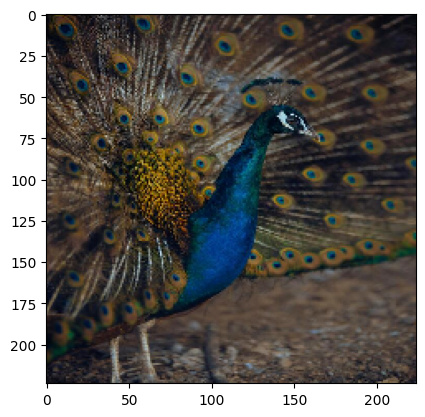

Mountain
False


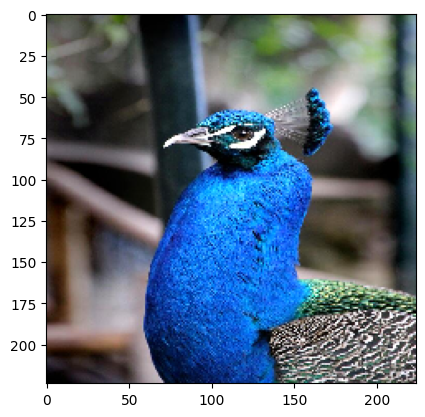

Mountain
False


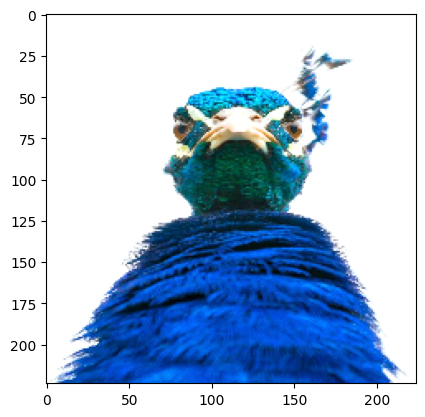

Mountain
False


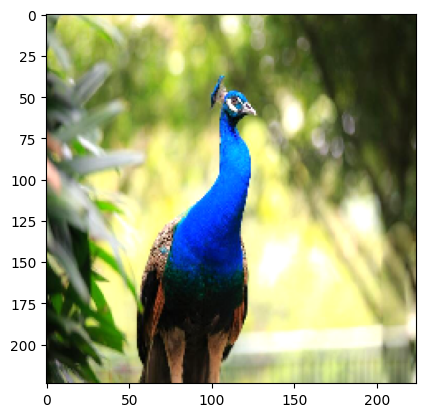

Mountain
False


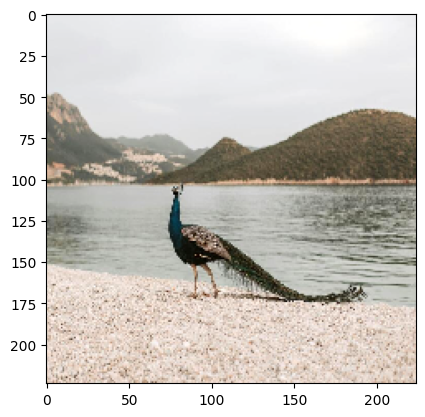

Mountain
True


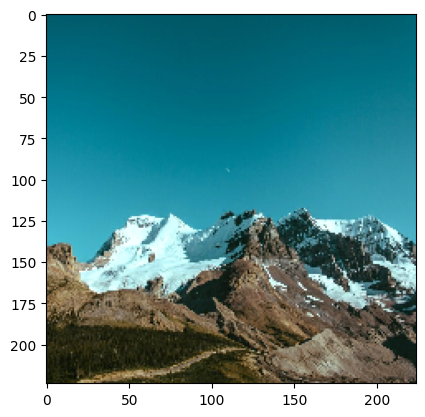

Mountain
True


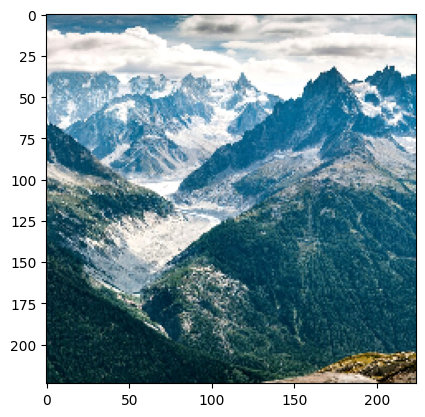

Mountain
True


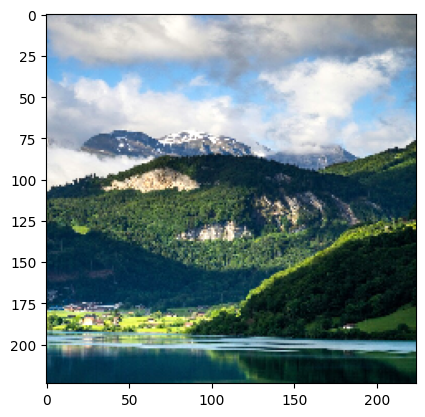

Mountain
True


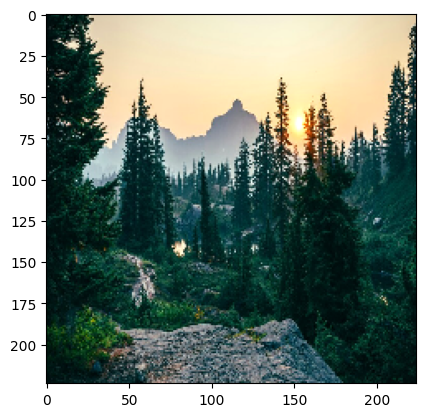

Mountain
True


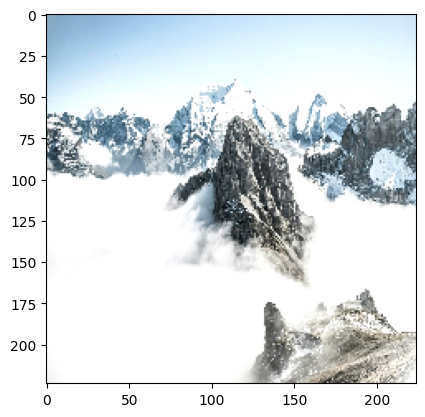

In [ ]:
for i in range(40):
  if i%4 == 0:
    answer = predicted_vgg3[i]
    actual_answer = test_labels[i]
    if answer == 1:
      print("Peacock")
    else:
      print("Mountain")
    print(answer == actual_answer)
    plt.imshow(test_images[i])
    plt.show()

In [ ]:
accuracy_score(predicted_vgg3, test_labels)

0.5

# Table with Models (Shivam)

In [ ]:
from tabulate import tabulate

data = {'models': ['VGG 1-Block', 'VGG 2-Block', 'VGG 3-Block'],
        'Training Time(sec)': [141, 213, 275],
        'Training Loss': [0.0879,0.0271,0.1107],
        'Training Accuracy': [0.9688,0.9937,0.9625],
        'Testing Accuracy': [0.825,0.875,0.85]}

df = pd.DataFrame(data)

table = tabulate(df, headers='keys', tablefmt='pretty', showindex=False)
print(table)

+-------------+--------------------+---------------+-------------------+------------------+
|   models    | Training Time(sec) | Training Loss | Training Accuracy | Testing Accuracy |
+-------------+--------------------+---------------+-------------------+------------------+
| VGG 1-Block |        141         |    0.0879     |      0.9688       |      0.825       |
| VGG 2-Block |        213         |    0.0271     |      0.9937       |      0.875       |
| VGG 3-Block |        275         |    0.1107     |      0.9625       |       0.85       |
+-------------+--------------------+---------------+-------------------+------------------+


# VGG16 Transfer Learning

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Dense

# Load the pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=True)

# Freeze the desired layers
for layer in base_model.layers:
    layer.trainable = False  # Set all layers to non-trainable initially

# Remove the existing output layer
x = base_model.output

# Add a new output layer for binary classification
x = Dense(256, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Output layer with sigmoid activation for binary classification

# Define the model
VGG16 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
VGG16.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
print(VGG16.summary())


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

# Tuning only Dense Layers

In [ ]:
for layer in VGG16.layers[13:]:  # Unfreeze from 15th layer
    layer.trainable = True

VGG16.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
history_VGG16 = VGG16.fit(train_images, train_labels, epochs = 15, batch_size = 32)

Epoch 1/15
5/5 [==============================] - 14s 183ms/step - loss: 0.6946 - accuracy: 0.4875
Epoch 2/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6936 - accuracy: 0.5000
Epoch 3/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6935 - accuracy: 0.4250
Epoch 4/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6933 - accuracy: 0.4500
Epoch 5/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6933 - accuracy: 0.4750
Epoch 6/15
5/5 [==============================] - 1s 186ms/step - loss: 0.6935 - accuracy: 0.4500
Epoch 7/15
5/5 [==============================] - 1s 185ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 8/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 9/15
5/5 [==============================] - 1s 187ms/step - loss: 0.6934 - accuracy: 0.4625
Epoch 10/15
5/5 [==============================] - 1s 184ms/step - loss: 0.6933 - accuracy: 0.5000
Epoch 11/15
5/5 [=

In [ ]:
file_path = '/content/drive/MyDrive/Assignment4/VGG16_model.pkl'

# Load the model
with open(file_path, 'wb') as f:
    pickle.dump(VGG16, f)

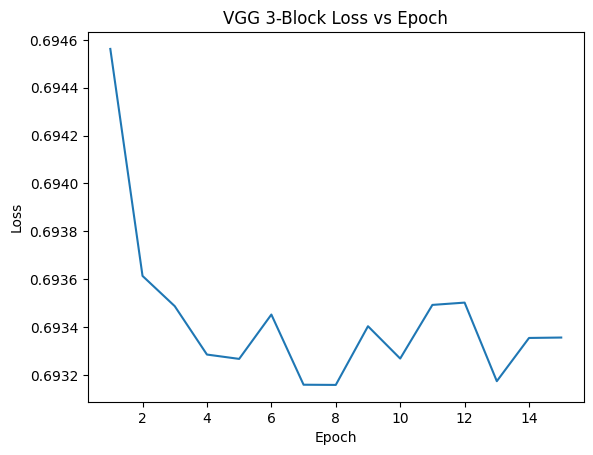

In [ ]:
VGG16_loss = history_VGG16.history['loss']
x3 = [i+1 for i in range(15)]

plt.plot(x3, VGG16_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VGG 3-Block Loss vs Epoch')
plt.show()

In [ ]:
VGG16 = pickle.load(open('/content/drive/MyDrive/Assignment4/VGG16_model.pkl', 'rb'))

In [ ]:
predicted_vgg16  = VGG16.predict(test_images).astype('int32').reshape(40,)
predicted_vgg16

2/2 [==============================] - 3s 3s/step


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Mountain
False


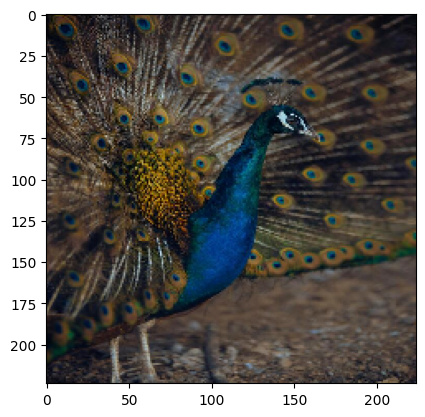

Mountain
False


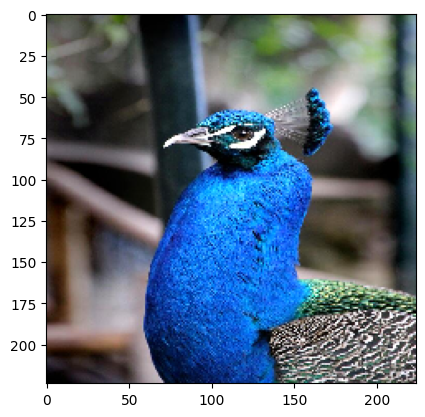

Mountain
False


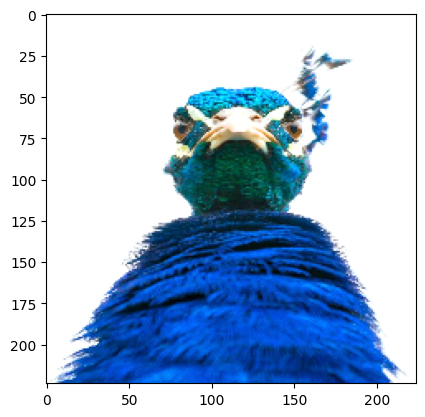

Mountain
False


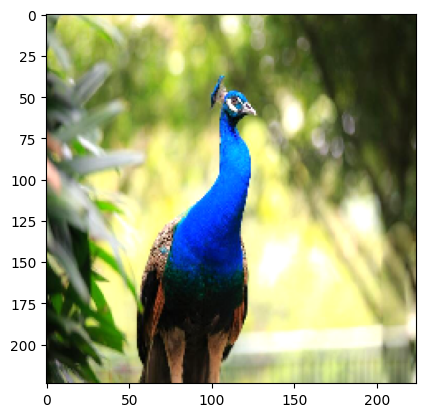

Mountain
False


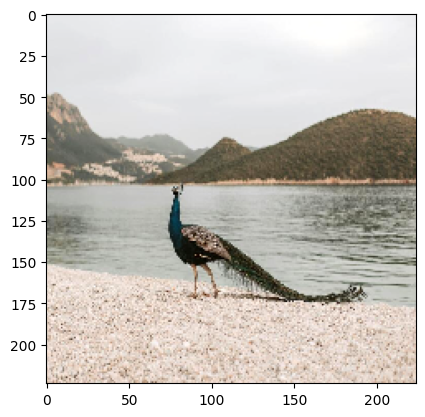

Mountain
True


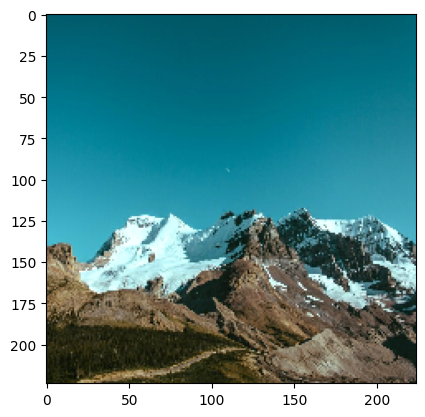

Mountain
True


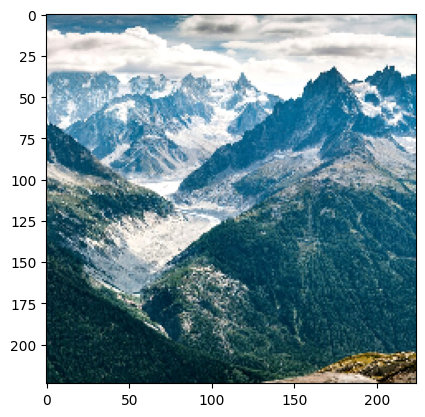

Mountain
True


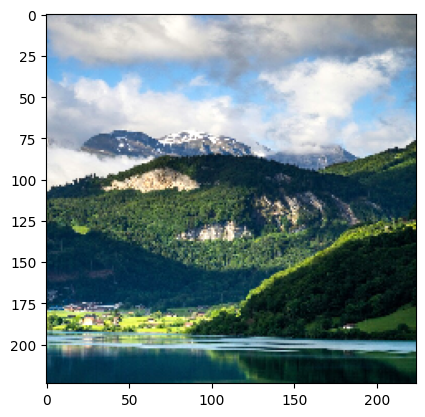

Mountain
True


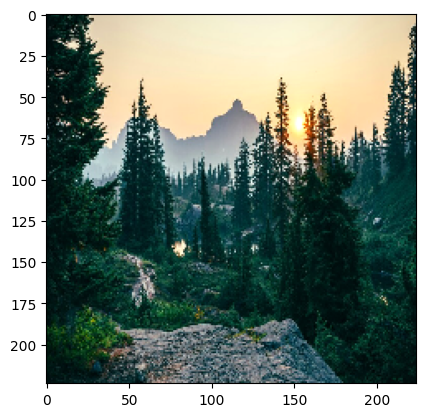

Mountain
True


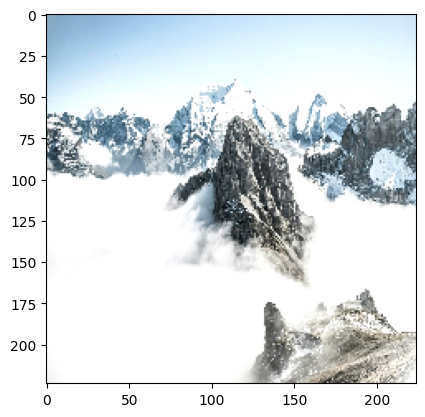

In [ ]:
for i in range(40):
  if i%4 == 0:
    answer = predicted_vgg16[i]
    actual_answer = test_labels[i]
    if answer == 1:
      print("Peacock")
    else:
      print("Mountain")
    print(answer == actual_answer)
    plt.imshow(test_images[i])
    plt.show()

In [ ]:
accuracy_score(predicted_vgg16, test_labels)

0.5

# Tuning all Layers

In [ ]:
for layer in VGG16.layers[0:]:  # Unfreeze from 15th layer
    layer.trainable = True

VGG16_all_tuned = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
VGG16_all_tuned.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
print(VGG16_all_tuned.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
history_VGG16_all_tuned = VGG16_all_tuned.fit(train_images, train_labels, epochs = 15, batch_size = 32)

Epoch 1/15
5/5 [==============================] - 5s 180ms/step - loss: 0.6938 - accuracy: 0.4375
Epoch 2/15
5/5 [==============================] - 1s 171ms/step - loss: 0.6933 - accuracy: 0.5000
Epoch 3/15
5/5 [==============================] - 1s 170ms/step - loss: 0.6939 - accuracy: 0.5000
Epoch 4/15
5/5 [==============================] - 1s 173ms/step - loss: 0.6933 - accuracy: 0.5000
Epoch 5/15
5/5 [==============================] - 1s 171ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 6/15
5/5 [==============================] - 1s 171ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 7/15
5/5 [==============================] - 1s 171ms/step - loss: 0.6932 - accuracy: 0.4875
Epoch 8/15
5/5 [==============================] - 1s 177ms/step - loss: 0.6934 - accuracy: 0.4250
Epoch 9/15
5/5 [==============================] - 1s 179ms/step - loss: 0.6933 - accuracy: 0.5000
Epoch 10/15
5/5 [==============================] - 1s 176ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 11/15
5/5 [==

In [ ]:
file_path = '/content/drive/MyDrive/Assignment4/VGG16_all_tuned_model.pkl'

# Load the model
with open(file_path, 'wb') as f:
    pickle.dump(VGG16_all_tuned, f)

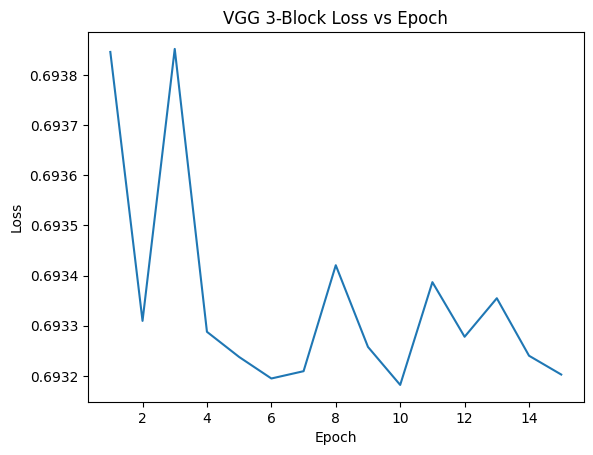

In [ ]:
VGG16_all_tuned_loss = history_VGG16_all_tuned.history['loss']
x3 = [i+1 for i in range(15)]

plt.plot(x3, VGG16_all_tuned_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VGG 3-Block Loss vs Epoch')
plt.show()

In [ ]:
VGG16_all_tuned = pickle.load(open('/content/drive/MyDrive/Assignment4/VGG16_all_tuned_model.pkl', 'rb'))

In [ ]:
predicted_vgg16_all_tuned  = VGG16_all_tuned.predict(test_images).astype('int32').reshape(40,)
predicted_vgg16_all_tuned

2/2 [==============================] - 1s 168ms/step


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Mountain
False


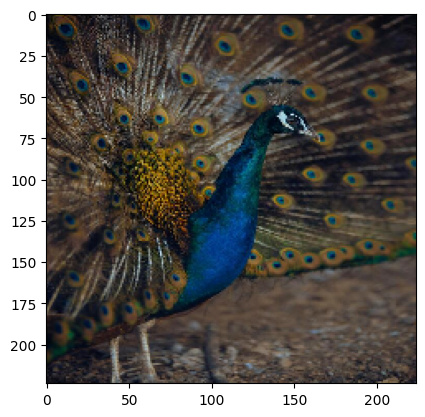

Mountain
False


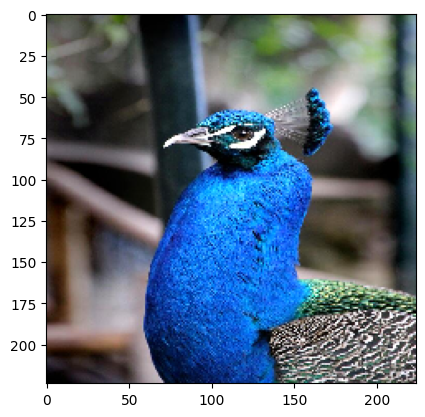

Mountain
False


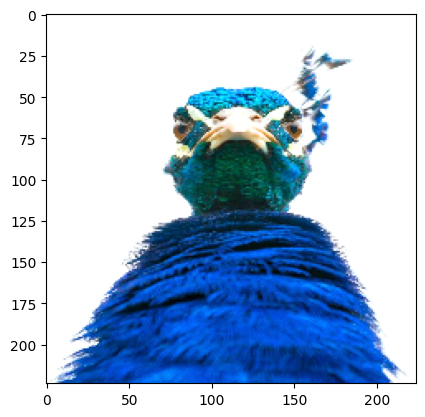

Mountain
False


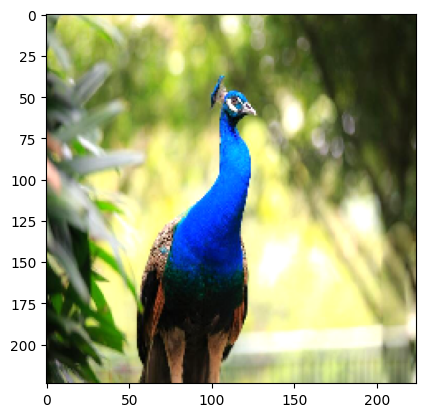

Mountain
False


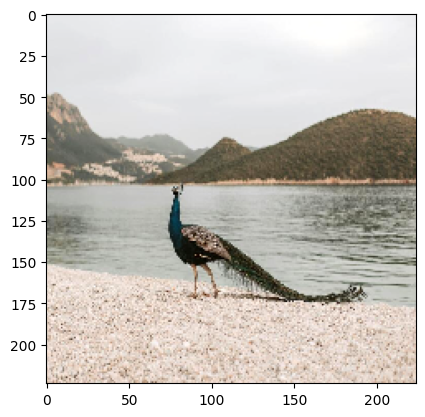

Mountain
True


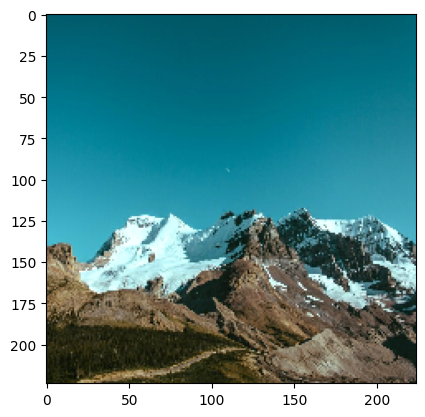

Mountain
True


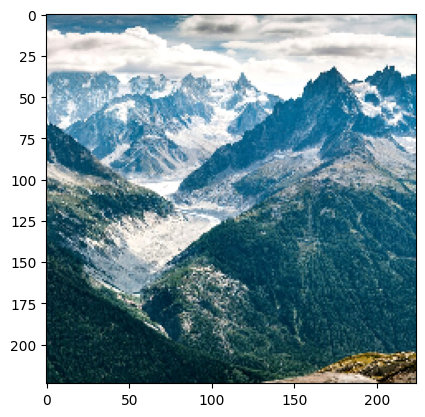

Mountain
True


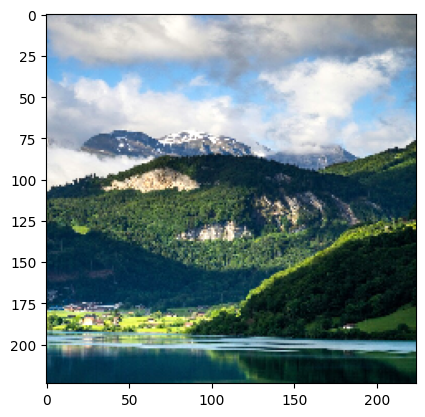

Mountain
True


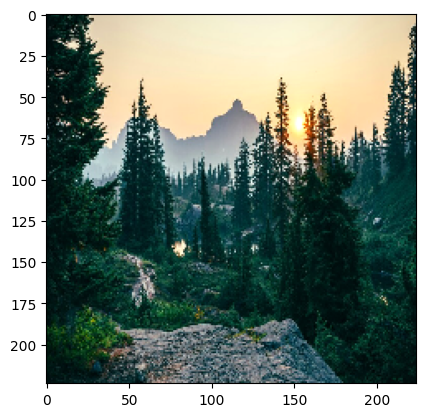

Mountain
True


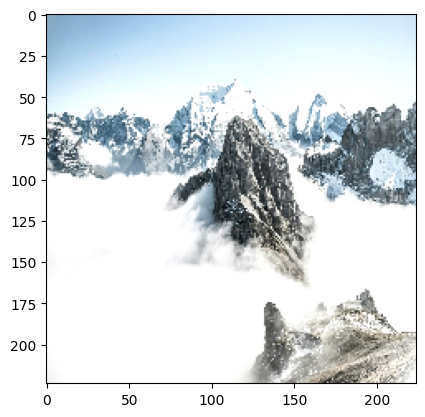

In [ ]:
for i in range(40):
  if i%4 == 0:
    answer = predicted_vgg16_all_tuned[i]
    actual_answer = test_labels[i]
    if answer == 1:
      print("Peacock")
    else:
      print("Mountain")
    print(answer == actual_answer)
    plt.imshow(test_images[i])
    plt.show()

In [ ]:
accuracy_score(predicted_vgg16_all_tuned, test_labels)

0.5